Entrega del lab 8
----

In [30]:
import sisl
import sisl.viz
import plotly.express as px
from sisl.viz import get_figure, plot_actions

#### kpoints

En aquesta part de la pràctica hem estudiat pel grafè, quins és el número òptim de punts k que podem fer servir per simular-lo. Per això, el que hem fet ha estat anar variant el número de kpoints en el geom.fdf i calculant la energia i el temps de càlcul. Els resultats obtinguts han estat:

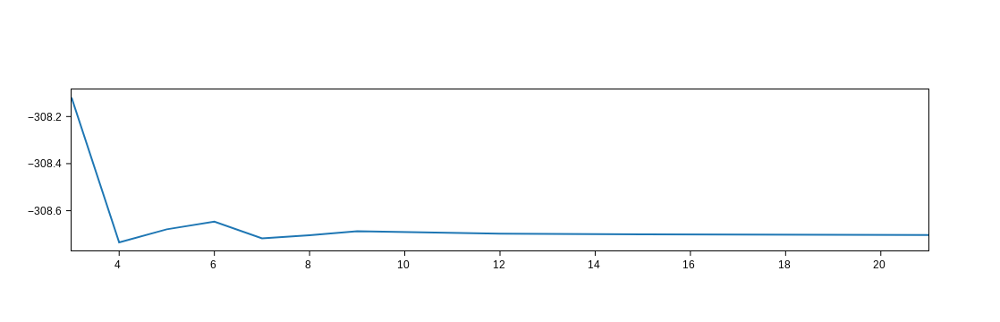

In [31]:
kpoints1 = plot_actions.draw_line(x=[1,2,3,4,5,6,7,8,9,12,15,18,21], y=[-301.6146,-306.553141,-308.119011,-308.734557,-308.679007,-308.646414,-308.71743,-308.703955,-308.687223,-308.697165,-308.700793,-308.702422,-308.70326], line={})
get_figure(backend="plotly", plot_actions=[kpoints])

Ara fem el mateix dibuix però sense els dos primers punts per veure més en detall el que passa. 

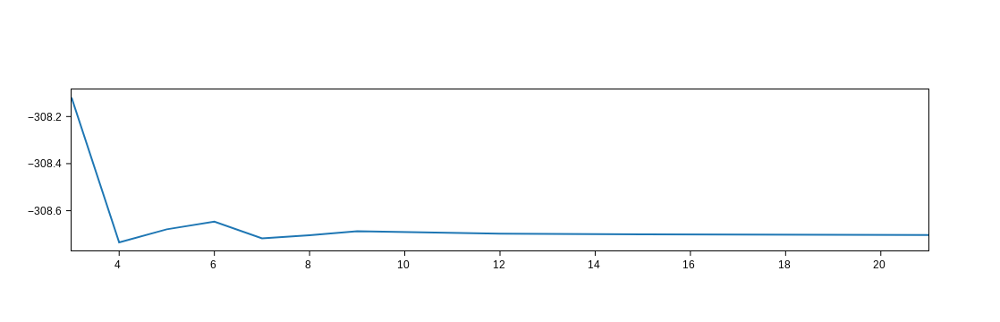

In [32]:
kpoints2 = plot_actions.draw_line(x=[3,4,5,6,7,8,9,12,15,18,21], y=[-308.119011,-308.734557,-308.679007,-308.646414,-308.71743,-308.703955,-308.687223,-308.697165,-308.700793,-308.702422,-308.70326], line={})
get_figure(backend="plotly", plot_actions=[kpoints])

Aquí veiem que abans de convergir fa unes petites oscil·lacions. Si fem un últim zoom 

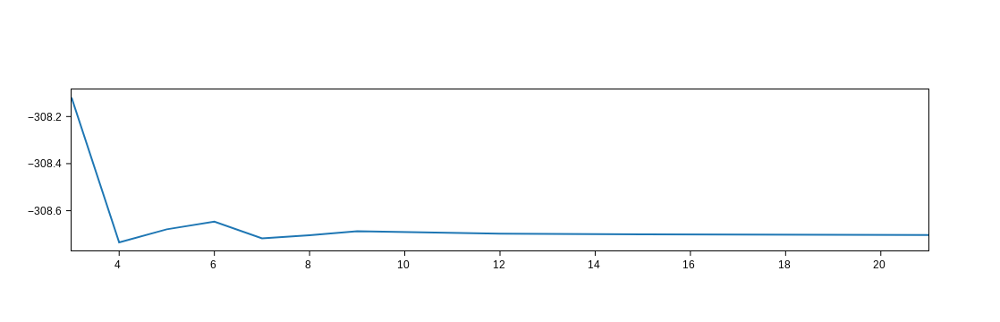

In [33]:
kpoints3 = plot_actions.draw_line(x=[4,5,6,7,8,9,12,15,18,21], y=[-308.734557,-308.679007,-308.646414,-308.71743,-308.703955,-308.687223,-308.697165,-308.700793,-308.702422,-308.70326], line={})
get_figure(backend="plotly", plot_actions=[kpoints2])

Veiem que el valor de k=8 pot ser bastant encertat per fer un posterior estudi, però si no, a kpoints=12 ja deixa de oscil·lar i també s'apropa bastant.

Si, per una altra banda, ens fixem en el temps de càlcul, veiem que:

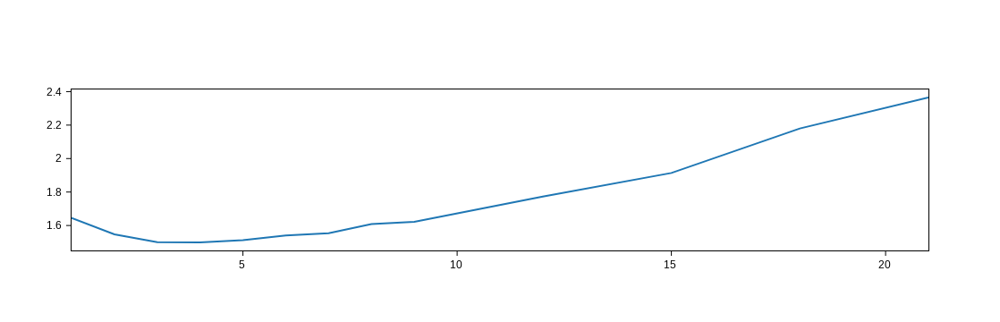

In [36]:
time = plot_actions.draw_line(x=[1,2,3,4,5,6,7,8,9,12,15,18,21], y=[1.645, 1.547, 1.501, 1.499, 1.512, 1.541, 1.554, 1.608, 1.622, 1.773, 1.914, 2.18, 2.365], line={})
get_figure(backend="plotly", plot_actions=[time])

Com veiem, aquí podríem dir que també millor agafar el kpoints=8, perquè necessita un 10% menys de temps que el kpoints=12. Si no, com que en aquest cas, tampoc es necessita molt temps de càlcul, també podriem utilitzar els altres, sempre tenint en compte que necessiten més temps de càlcul sent més o menys un 50% més amb 21kpoints.

**Conclusió:** Es podria fer amb kpoints=8. A més, una altra cosa a tenir en compte, és que un rang en el qual ja es podria considerar una bona convergencia és més o menys quan la diferència d'energia és 1meV (per àtom de cel·la unitat) així que per kapoints=8-9 ja serviria. 

#### Simulació BN

Per fe aquesta segona part, hem de fer la mateixa simulació que a classe hem fet amb el grafé, però amb BN. Per això mateix, ens descarreguem els .psf del B i N del link que ens ha proporcionar el professor. Llavors, les coses que hem de canviar del script respecte el grafé, són:

LatticeConstant 1.0 Ang

%block LatticeVectors

2.13000000 -1.22975607 0.00000000

2.13000000 1.22975607 0.00000000

0.00000000 0.00000000 14.20000000

%endblock LatticeVectors


NumberOfAtoms 2

AtomicCoordinatesFormat Ang

%block AtomicCoordinatesAndAtomicSpecies

0.00000000 0.00000000 0.00000000 **1 # 1: B**

1.42000000 0.00000000 0.00000000 **2 # 2: N**

%endblock AtomicCoordinatesAndAtomicSpecies

NumberOfSpecies **2**2

%block ChemicalSpeciesLabel

**1 5 B**

**2 7 N**

%endblock ChemicalSpeciesLabel


%block kgrid.MonkhorstPack

**9 0 0  0**

**0 9 0  0**

**0 0 1  0**

%endblock kgrid.MonkhorstPack


TS.HS.Save true

SaveRho true




Així que el que farem és comprar les dues, així que fem tot per duplicat, el del grafé el fico amb HC i el BN amb HBN.

In [35]:
# Conto que entor al jupyter des de dins de la carpeta entrega_del_lab_8
HC = sisl.get_sile("C/inputs/geom.fdf").read_hamiltonian()

In [36]:
# Conto que entor al jupyter des de dins de la carpeta entrega_del_lab_8
HBN = sisl.get_sile("BN/inputs/geom.fdf").read_hamiltonian()

#### Bands

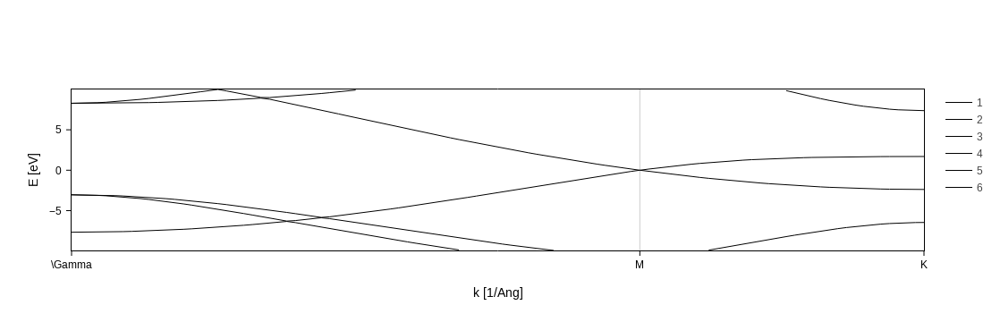

In [42]:
band_struct_C = sisl.BandStructure(HC, points=[[0, 0, 0], [2/3, 1/3, 0], [1/2, 0, 0]],
    divisions=100, names=[r"\Gamma", "M", "K"]
)
band_struct_C.plot(HC, Erange=[-10, 10])

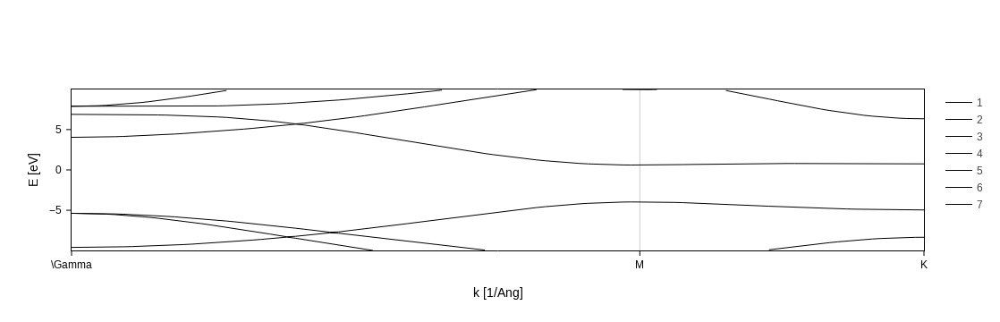

In [43]:
band_struct_BN = sisl.BandStructure(HBN, points=[[0, 0, 0], [2/3, 1/3, 0], [1/2, 0, 0]],
    divisions=100, names=[r"\Gamma", "M", "K"])
band_struct_BN.plot(Erange=[-10, 10])

Si ens fixem, dona una cosa similar al que vam veure a classe. En el cas del carboni a E=0, es creuen les bandes, mentres que en el BN tenim un gap. Tot i això, les altres línies segueixen una tendència similar. 

#### Fatbands

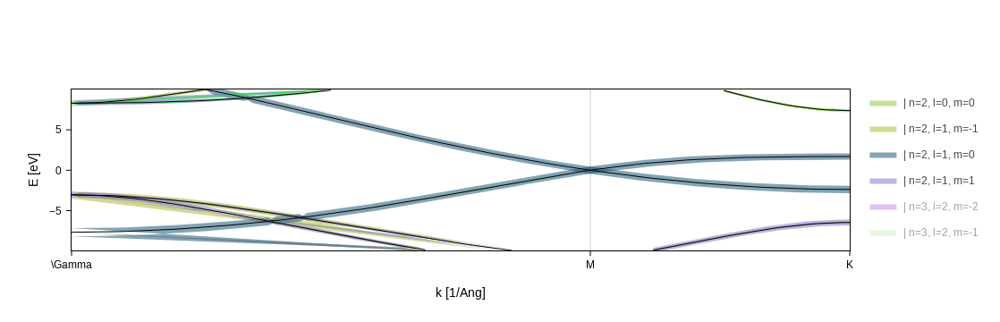

In [46]:
fatbands_C = band_struct_C.plot.fatbands(HC, Erange=[-10, 10])
fatbands_C.split_groups(on="n+l+m")

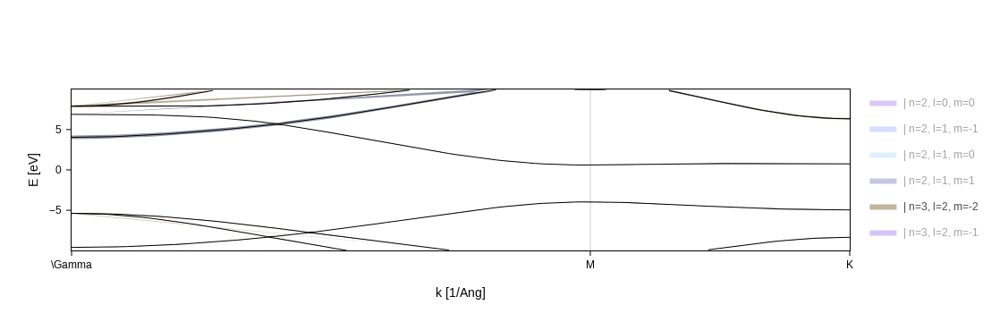

In [47]:
fatbands_BN = band_struct_BN.plot.fatbands(HBN, Erange=[-10, 10])
fatbands_BN.split_groups(on="n+l+m")

Si ens fixem en les *fat bands*, veiem que tant en una com en l'altra dona una cosa similar, que el 2pz és el que contribueix més al voltant del 0 i qe en general n=2 estan més a baix i n=3 més cap a dalt i en aquest rang casi no afecten. 

#### PDOS

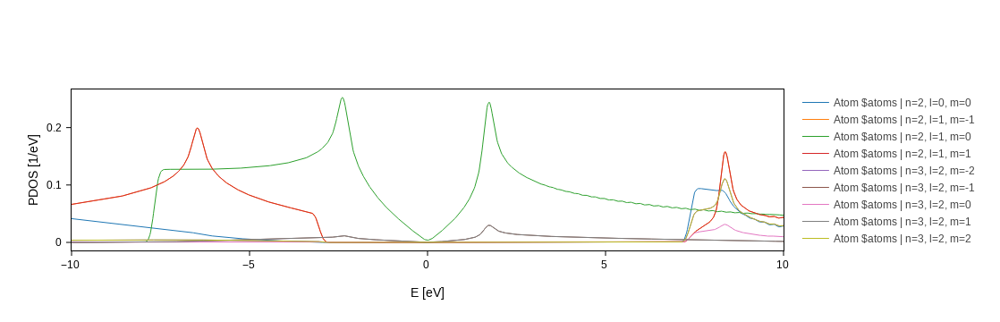

In [49]:
pdos_plot_C = HC.plot.pdos(
    kgrid=[90,90,1], nE=1000, Erange=[-10, 10], data_Erange=[-10, 10],
    distribution=sisl.get_distribution(method="gaussian", smearing=0.1)
)
# Split the contributions by the n and l quantum numbers
pdos_plot_C.split_DOS(on="n+l+m", name="Atom $atoms")

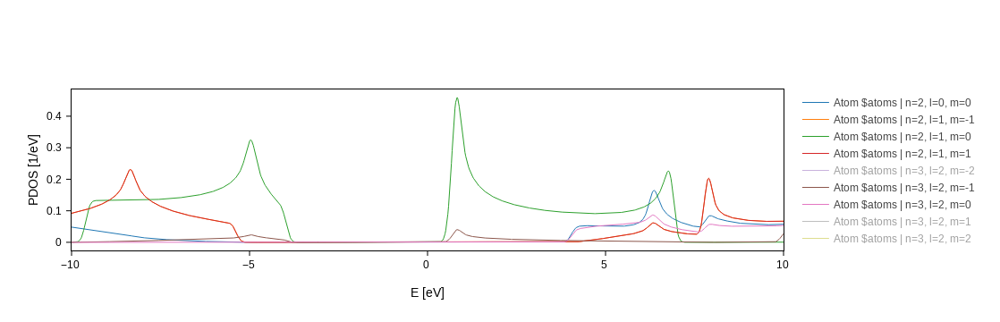

In [50]:
pdos_plot_BN = HBN.plot.pdos(
    kgrid=[90,90,1], nE=1000, Erange=[-10, 10], data_Erange=[-10, 10],
    distribution=sisl.get_distribution(method="gaussian", smearing=0.1)
)
# Split the contributions by the n and l quantum numbers
pdos_plot_BN.split_DOS(on="n+l+m", name="Atom $atoms")

En aquest cas, veiem el mateix que hem dit abans l'únic que aquí es veu millor lo del gap que hi ha. A més, aquí veiem que en els dos casos ens dona la mateixa contribució en px i py, que té sentit. A part, veiem que també hi ha simetria entre els d, com és entre m=-2 i m=2 i entre m=-1 i m=1.

**Just for fun:**

Podem veure també la densitat d'estats

In [51]:
rho_C = sisl.get_sile("C/inputs/geom.fdf").read_grid("RHO")

dep:0: SislDeprecation:

__init__ argument bc has been deprecated (removed) in favor of the boundary conditions in Lattice, please update your code. [>=0.15.0]



In [53]:
rho_BN = sisl.get_sile("BN/inputs/geom.fdf").read_grid("RHO")

dep:0: SislDeprecation:

__init__ argument bc has been deprecated (removed) in favor of the boundary conditions in Lattice, please update your code. [>=0.15.0]



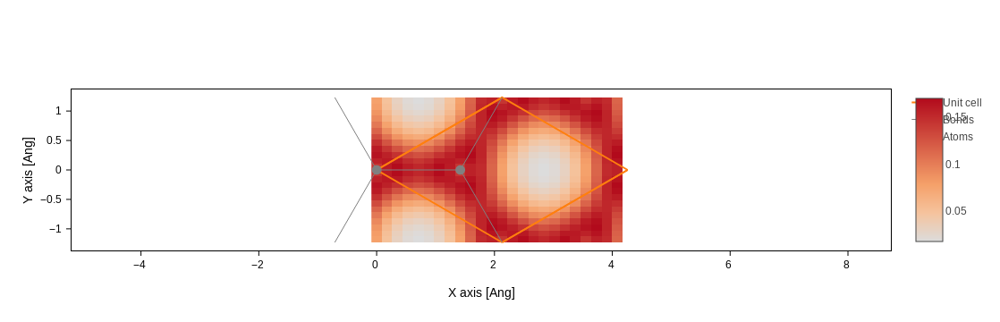

In [54]:
rho_C.plot(axes="xy", plot_geom=True)

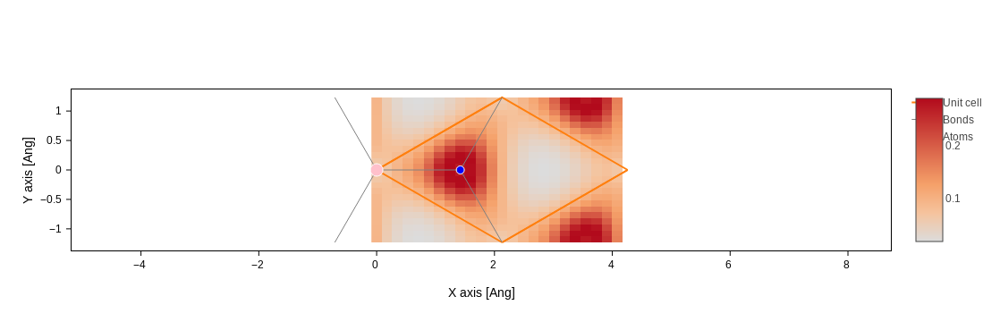

In [57]:
rho_BN.plot(axes="xy", plot_geom=True)

Veiem en aquest cas que la densitat d estats és similar. Això ha de ser perquè el àtom al ser de Carboni els electrons poden es comparteixen de igual manera ja que la càrrega és al mateixa. 
Per una altra banda, en el BN, tenim una càrrga positiva i una negativa, per tant, com que en el meu cas, he ficat el B en el (000), aquí no hi haurà casi electrons perquè estaran en el N, que és on es on hi ha més densitat electrerònica. Això és perquè el N té càrrega negativa i atreu els electrons. 